## Convolutional Neural Networks

A Convolutional Neural Network (ConvNet/CNN) is a Deep Learning algorithm that can take an input image, assign importance (learnable weights and biases) to various aspects/objects in the image, and be able to differentiate one from another. The preprocessing required in a ConvNet is much less compared to other classification algorithms. While in primitive methods, filters are handcrafted, with sufficient training, ConvNets have the ability to learn these filters/features. In 1962, Hubel and Wiesel performed an experiment showing that some neurons activate together when exposed to certain lines or curves, thus producing visual recognition.
This is essentially the main idea of a Convolutional Network: to filter lines, curves, and edges and, in each additional layer, transform this filtering into a more complex image.

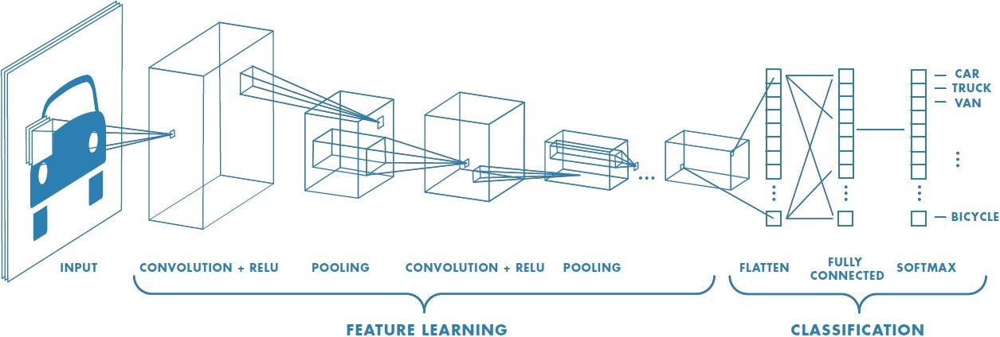

CNN X ANN

An image is nothing more than a matrix of pixel values, right? So why not just flatten the image (e.g., convert a 3x3 matrix into a 9x1 vector. If the image is a matrix, there's no problem converting it to a vector) and feed it to a Multi-Layer Perceptron for classification purposes? Not really.

In cases of extremely basic binary images, the method might show an average accuracy score during class prediction, but it would have little or no accuracy when dealing with complex images with ubiquitous pixel dependencies.

A ConvNet is able to successfully capture the spatial and temporal dependencies in an image by applying relevant filters. The architecture performs a better fit to the image dataset due to the reduced number of parameters involved and the ability to reuse weights. In other words, the network can be trained to better understand the image's sophistication.

When we talk about image recognition/classification, the inputs are usually three-dimensional matrices with height and width (depending on the image dimensions) and depth, determined by the number of color channels. Images typically use three channels, RGB, representing the values of each pixel.

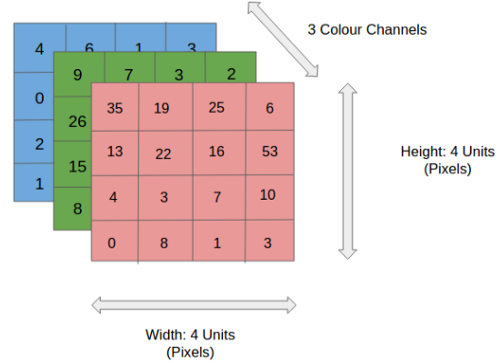

##Convolutional Kernels

A kernel is a filter we'll use on our images. It passes through the entire image, from left to right, top to bottom, applying the convolution product. In the end, we'll have a filtered image.

In image processing, a convolution kernel is a 2D matrix used to filter images. Also known as a convolution matrix, a convolution kernel is typically a square, MxN matrix, where M and N are odd integers (e.g., 3×3, 5×5, 7×7, etc.). See the example 3×3 matrix provided below.

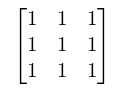

2D 3×3 Convolution Kernel

These kernels can be used to perform mathematical operations on each pixel of an image to achieve the desired effect (such as blurring or sharpening an image). But why would you want to blur an image? Here are two important reasons:

Because it reduces certain types of noise in an image. For this reason, blurring is often called smoothing.
To remove a distracting background, you can intentionally blur parts of an image, as is done in Portrait mode on mobile device cameras.
As a fundamental processing technique in Computer Vision, image filtering with kernels has many more applications.

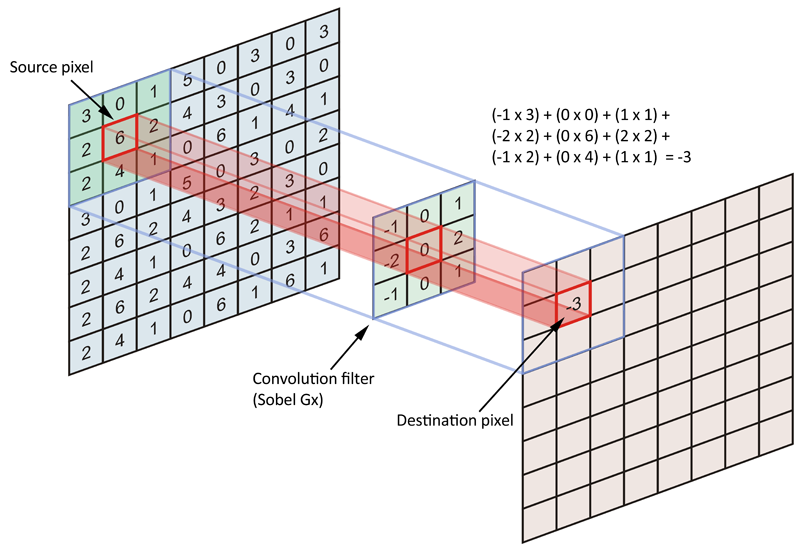

### Convolutions

Convolutions function like filters that see small squares and "slide" across the entire image, capturing the most striking features. To explain further, with a 32x32x3 image and a filter that covers a 5x5 area of the image with a 2-hop movement (called a stride), the filter will pass through the entire image, through each channel, ultimately forming a 28x28x1 feature map or activation map.
The depth of a convolution's output is equal to the number of filters applied. The deeper the convolution layers, the more detailed the features identified by the activation map.
The filter, also known as a kernel, is made up of randomly initialized weights, updating them with each new input during the backpropagation process. The small region of the input where the filter is applied is called the receptive field.

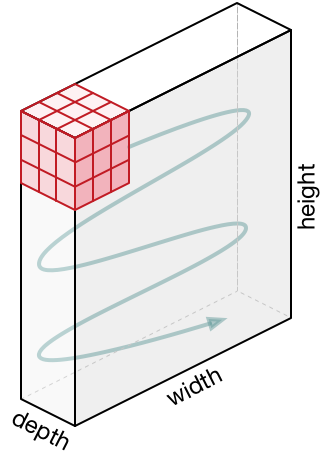

### Pooling Layer

A pooling layer serves to simplify the information from the previous layer. As with convolution, an area unit, such as 2x2, is chosen to pass through the entire output of the previous layer. The unit is responsible for summarizing the information from that area into a single value. If the output of the previous layer is 24x24, the pooling output will be 12x12. Furthermore, it is necessary to choose how the summarization will be performed. The most commonly used method is maxpooling, in which only the largest number of the unit is passed to the output. This data summarization serves to reduce the number of weights to be learned and also to avoid overfitting.

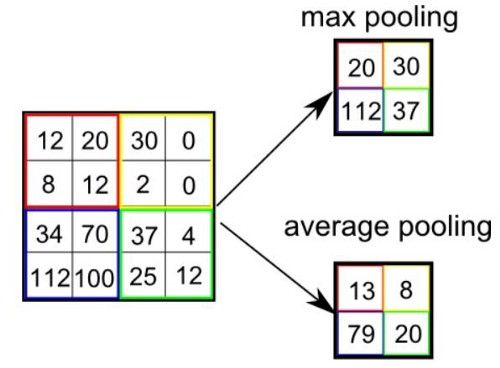

### Flatten Layer


This layer is typically used to divide the two parts of a CNN (feature extraction/traditional neural network). It essentially transforms the image matrix, changing its format to an array. For example, a 28x28 grayscale image will be transformed into an array of 784 positions. The image below illustrates this operation.

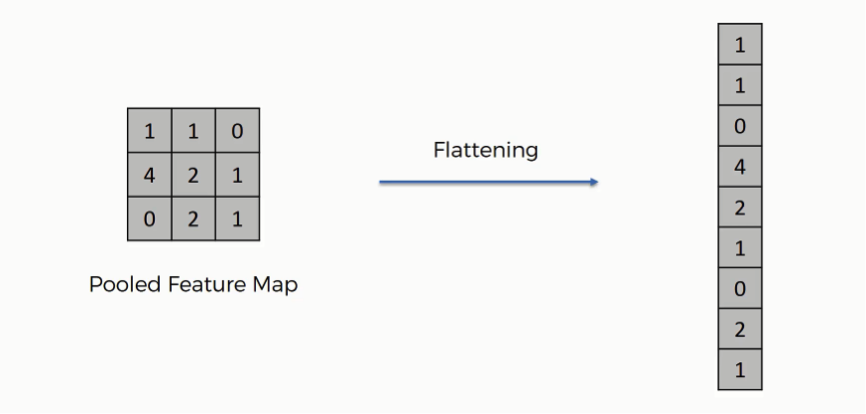

### Dense Layer

At the end of the network, a Fully connected layer is placed, where its input is the output of the previous layer and its output is N neurons, with N being the number of classes in your model to complete the classification.

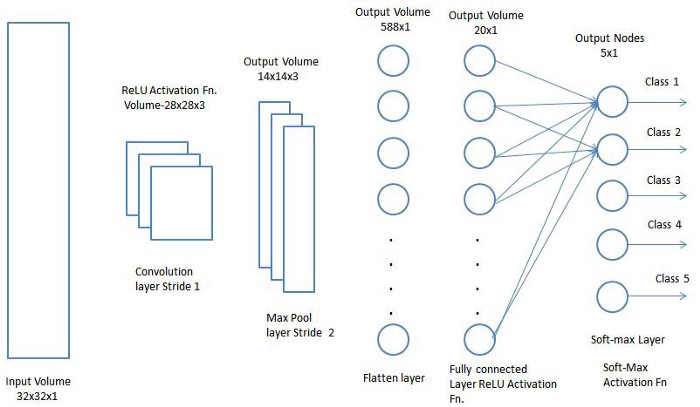

### Final Activation Layer for Classification

- Sigmoid: In the output layer, the sigmoid function is useful for producing probabilities in binary classification problems, since its results, in the range [0, 1], can be interpreted as the probability of a given instance belonging to a given class.

- Softmax: Softmax is a generalization of the sigmoid function for non-binary cases. It is not usually applied to the hidden layers of the neural network, but rather to the output layer of multiclass classification problems, since its characteristic is to produce values in the range [0, 1] where their sum is equal to 1. That is, in a problem with three classes, for example, the softmax function will produce three values, which sum to 1, where each value represents the probability of the instance belonging to one of the three possible classes.

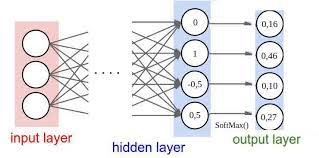

# Building detection with GEE + SAMGEO + CNNs

Link to Dataset: https://drive.google.com/drive/folders/1fDiI7ELcFIYS2F2zb2jcuCAxRF1k41u7?usp=sharing

First, let's download the NAIP image of the area of interest:

In [ ]:
import geopandas as gpd
import json

In [ ]:
import folium
from folium import plugins
from IPython.display import Image
import numpy as np
from matplotlib import pyplot as plt
import cv2

In [ ]:
import ee
ee.Authenticate()
ee.Initialize()

We select the coordinates of the area of interest:

In [ ]:
AOI = ee.Geometry.Polygon([[[-117.61760761324406, 33.448329152750276],
          [-117.61760761324406, 33.4258210035441],
          [-117.58567859713078, 33.4258210035441],
          [-117.58567859713078, 33.448329152750276]]])

We filter by date, apply the median to obtain a unique mosaic:

In [ ]:
startDateviz = ee.Date.fromYMD(2017,1,1);
endDateviz = ee.Date.fromYMD(2018,12,29);
collectionviz2 = ee.ImageCollection("USDA/NAIP/DOQQ").filterDate(startDateviz,endDateviz).filterBounds(AOI)

In [ ]:
Naip = collectionviz2.median().clip(AOI).uint8()

So we can export the Image:

In [ ]:
image_naip = Naip.select(['R','G','B']).reproject('EPSG:4326', None, 1)

In [ ]:
task = ee.batch.Export.image.toDrive(image=image_naip,
                                         crs='EPSG:4326',
                                         scale=1,
                                         fileFormat='GeoTIFF',
                                         description='NAIP_image' ,
                                         maxPixels=1e13,
                                         folder='California_image',
                                         region= AOI)

In [ ]:
task.start()

With the images downloaded to Google Drive, let's perform segmentation with SAM:

In [ ]:
!pip install segment-geospatial leafmap localtileserver
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 107.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 101.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 111.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.4/90.4 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

We connect to Drive to access the image and plot it with Matplotlib:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/Datasets/California_img/NAIP_image.tif'

In [ ]:
import os
import leafmap
import torch
from samgeo import SamGeo, tms_to_geotiff, get_basemaps
import rasterio
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from rasterio.plot import show

In [ ]:
src = rasterio.open(path)

In [ ]:
img = src.read()

In [ ]:
img.shape

(3, 2506, 3556)

In [ ]:
img = img.transpose([1,2,0])

In [ ]:
img.max()

237

(-0.5, 3555.5, 2505.5, -0.5)

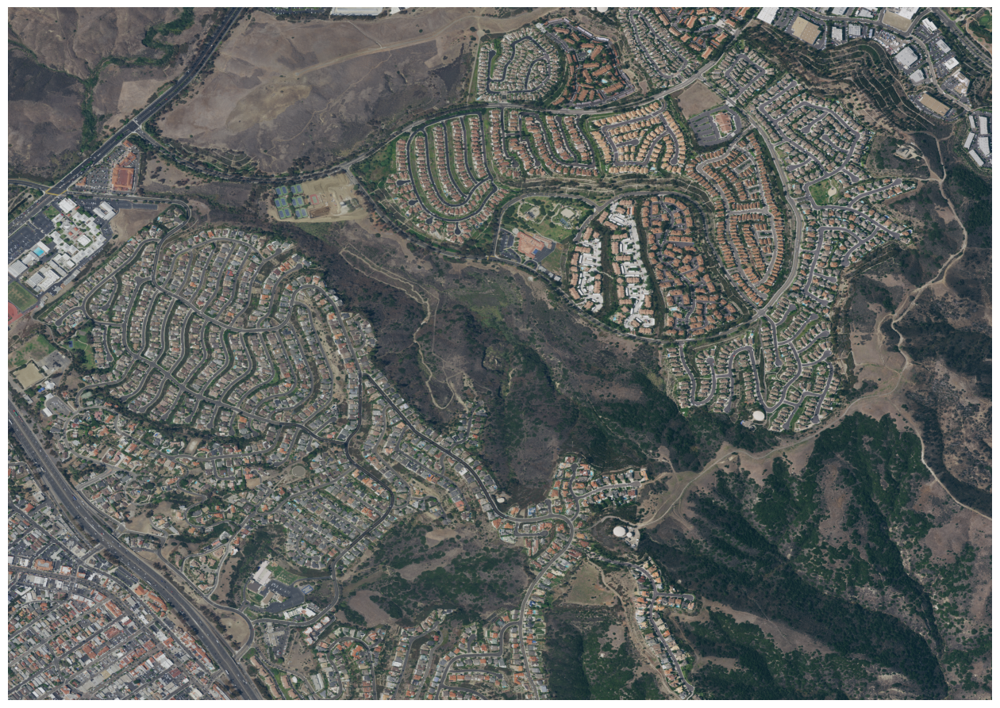

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Then we apply SAM to the resulting image:

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint="sam_vit_h_4b8939.pth",
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:18<00:00, 136MB/s]


In [ ]:
mask = "segment.tif"
sam.generate(
    path, mask, batch=True, foreground=True, erosion_kernel=(3, 3), mask_multiplier=255
)

100%|██████████| 48/48 [02:26<00:00,  3.04s/it]


We will convert the resulting SAM mask into a shapefile:

In [ ]:
if not os.path.isdir('/content/Result'):
    os.mkdir('/content/Result')

In [ ]:
shapefile = '/content/Result/segment.shp'
sam.tiff_to_vector(mask, shapefile)

To check the result, let's plot the image along with the segments:

In [ ]:
src_test = rasterio.open(path)

In [ ]:
mask_result = gpd.read_file(shapefile)

In [ ]:
mask_result

,value,geometry
0,255.0,"POLYGON ((-117.60869 33.44832, -117.60852 33.4..."
1,255.0,"POLYGON ((-117.60535 33.44832, -117.60533 33.4..."
2,255.0,"POLYGON ((-117.60532 33.44832, -117.60526 33.4..."
3,255.0,"POLYGON ((-117.60470 33.44832, -117.60463 33.4..."
4,255.0,"POLYGON ((-117.59728 33.44832, -117.59721 33.4..."
...,...,...
5700,255.0,"POLYGON ((-117.59037 33.42584, -117.59032 33.4..."
5701,255.0,"POLYGON ((-117.61408 33.42589, -117.61405 33.4..."
5702,255.0,"POLYGON ((-117.61226 33.42591, -117.61223 33.4..."
5703,255.0,"POLYGON ((-117.60876 33.42588, -117.60874 33.4..."


<Axes: >

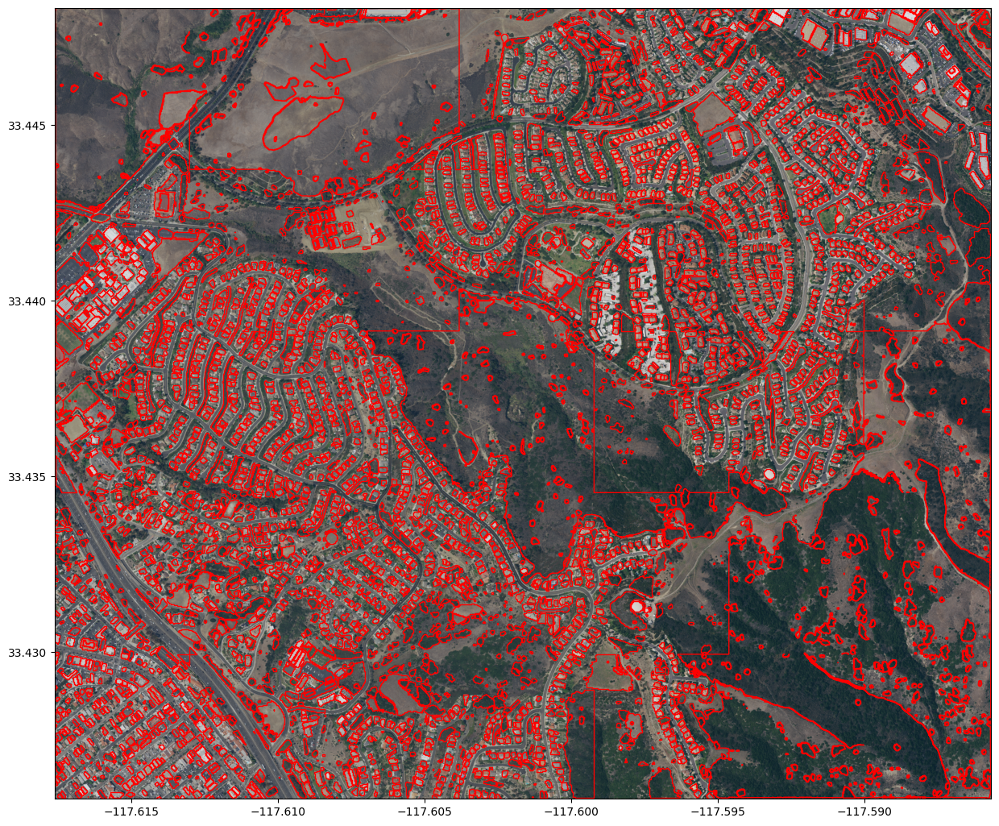

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(src_test, ax=ax)
mask_result.plot(ax=ax, facecolor='none', edgecolor='red')

After collecting the points, we will open the two shapefiles and intersect the points with the segments:

In [ ]:
nao_casas = gpd.read_file('/content/drive/MyDrive/Datasets/California_img/Outros.shp')
casas = gpd.read_file('/content/drive/MyDrive/Datasets/California_img/Casas.shp')

In [ ]:
nao_casas['class'] = 0
casas['class'] = 1

In [ ]:
samples = pd.concat([nao_casas,casas])

In [ ]:
segments = gpd.read_file('/content/drive/MyDrive/Datasets/California_img/segment.shp')

In [ ]:
segments.reset_index(inplace=True)

In [ ]:
seg_samples = segments.sjoin(samples, how='inner',predicate='intersects').copy()

Here we have the segments of the two classes that will be used in the training

<Axes: >

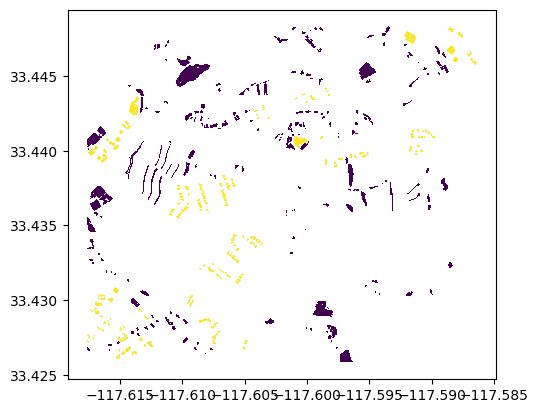

In [ ]:
seg_samples.plot('class',cmap='viridis')

In [ ]:
seg_samples = seg_samples[~seg_samples['index'].duplicated()]

In [ ]:
seg_samples

,index,value,geometry,index_right,id,class
49,49,255.0,"POLYGON ((-117.60094 33.44831, -117.60092 33.4...",73,None,0
50,50,255.0,"POLYGON ((-117.59932 33.44825, -117.59926 33.4...",72,None,0
77,77,255.0,"POLYGON ((-117.59976 33.44810, -117.59975 33.4...",149,None,0
95,95,255.0,"POLYGON ((-117.59895 33.44828, -117.59892 33.4...",71,None,0
96,96,255.0,"POLYGON ((-117.58857 33.44828, -117.58856 33.4...",201,None,1
...,...,...,...,...,...,...
5527,5527,255.0,"POLYGON ((-117.61399 33.42651, -117.61398 33.4...",100,None,1
5532,5532,255.0,"POLYGON ((-117.61481 33.42647, -117.61479 33.4...",94,None,1
5592,5592,255.0,"POLYGON ((-117.61506 33.42638, -117.61503 33.4...",101,None,1
5606,5606,255.0,"POLYGON ((-117.61523 33.42628, -117.61523 33.4...",102,None,1


After selecting the segments, we'll extract images from each segment. We'll convert these images to 80x80 and apply data augmentation.

In [ ]:
from rasterio.mask import mask
import cv2

In [ ]:
src = rasterio.open(path)

In [ ]:
json_dataset = json.loads(seg_samples.to_json())['features']

In [ ]:
X = []
Y = []
for i in range(len(json_dataset)):
  coords = json_dataset[i]['geometry']
  out_image, out_transform = mask(src, [coords], crop=True, filled=False)
  out_image = out_image.transpose([1,2,0])
  resized_image = cv2.resize(out_image, (80, 80))
  flipVertical  = cv2.flip(resized_image, 0)
  flipHorizontal  = cv2.flip(resized_image, 1)
  flipBoth = cv2.flip(resized_image, -1)
  image90 = cv2.rotate(resized_image, cv2.ROTATE_90_CLOCKWISE)
  rows,cols,_ = resized_image.shape
  M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),45,1)
  dst = cv2.warpAffine(resized_image,M,(cols,rows))

  X.append(resized_image)
  X.append(flipVertical)
  X.append(flipHorizontal)
  X.append(flipBoth)
  X.append(image90)
  X.append(dst)

  Y.append(json_dataset[i]['properties']['class'])
  Y.append(json_dataset[i]['properties']['class'])
  Y.append(json_dataset[i]['properties']['class'])
  Y.append(json_dataset[i]['properties']['class'])
  Y.append(json_dataset[i]['properties']['class'])
  Y.append(json_dataset[i]['properties']['class'])

X = np.array(X)
Y = np.array(Y)

Let's plot an example image:

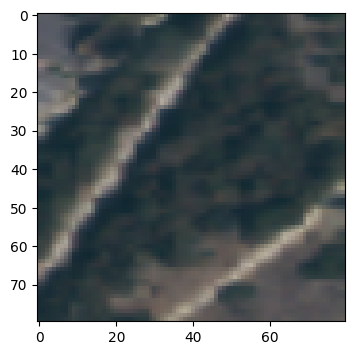

In [ ]:
plt.figure(figsize=[4,4])
plt.imshow(X[200])

With the image dataset ready, let's implement and train a convolutional network:

In [ ]:
X = X/255

In [ ]:
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, Activation
from tensorflow.keras.optimizers.legacy import Adam
from keras.activations import relu
from keras.losses import binary_crossentropy
from keras import backend as K
import tensorflow as tf
from keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

In [ ]:
Model = Sequential()
Model.add(Conv2D(32,(3,3), kernel_initializer="he_normal", padding='same', input_shape=(x_train.shape[1:])))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(BatchNormalization())
Model.add(Dropout(0.25))
Model.add(Conv2D(64,(3,3), kernel_initializer="he_normal", padding='same'))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(BatchNormalization())
Model.add(Dropout(0.25))
Model.add(Conv2D(128,(3,3), kernel_initializer="he_normal", padding='same'))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(Flatten())
Model.add(Dense(128))
Model.add(Activation('relu'))
Model.add(Dropout(0.25))
Model.add(Dense(32))
Model.add(Activation('relu'))
Model.add(Dense(1))
Model.add(Activation('sigmoid'))
Model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.00001, decay=1e-6), metrics=['accuracy'])
Model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 80, 80, 32)        896       
                                                                 
 activation (Activation)     (None, 80, 80, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 40, 40, 32)        0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 40, 40, 32)        128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 40, 40, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 64)        1

In [ ]:
history = Model.fit(x = x_train, y= y_train, batch_size=64, epochs=200, verbose=1, shuffle=True, validation_split=0.2)

Epoch 1/200
25/25 [==============================] - 11s 31ms/step - loss: 0.4989 - accuracy: 0.7736 - val_loss: 0.6454 - val_accuracy: 0.5267
Epoch 2/200
25/25 [==============================] - 0s 12ms/step - loss: 0.3463 - accuracy: 0.8610 - val_loss: 0.6628 - val_accuracy: 0.5267
Epoch 3/200
25/25 [==============================] - 0s 12ms/step - loss: 0.3038 - accuracy: 0.8776 - val_loss: 0.6644 - val_accuracy: 0.5267
Epoch 4/200
25/25 [==============================] - 0s 12ms/step - loss: 0.2821 - accuracy: 0.8737 - val_loss: 0.6861 - val_accuracy: 0.5267
Epoch 5/200
25/25 [==============================] - 0s 12ms/step - loss: 0.2730 - accuracy: 0.8948 - val_loss: 0.6727 - val_accuracy: 0.5267
Epoch 6/200
25/25 [==============================] - 0s 12ms/step - loss: 0.2622 - accuracy: 0.9075 - val_loss: 0.6715 - val_accuracy: 0.5267
Epoch 7/200
25/25 [==============================] - 0s 12ms/step - loss: 0.2546 - accuracy: 0.8992 - val_loss: 0.6222 - val_accuracy: 0.5547
Epoch

We can plot the loss and accuracy curves according to the number of epochs:

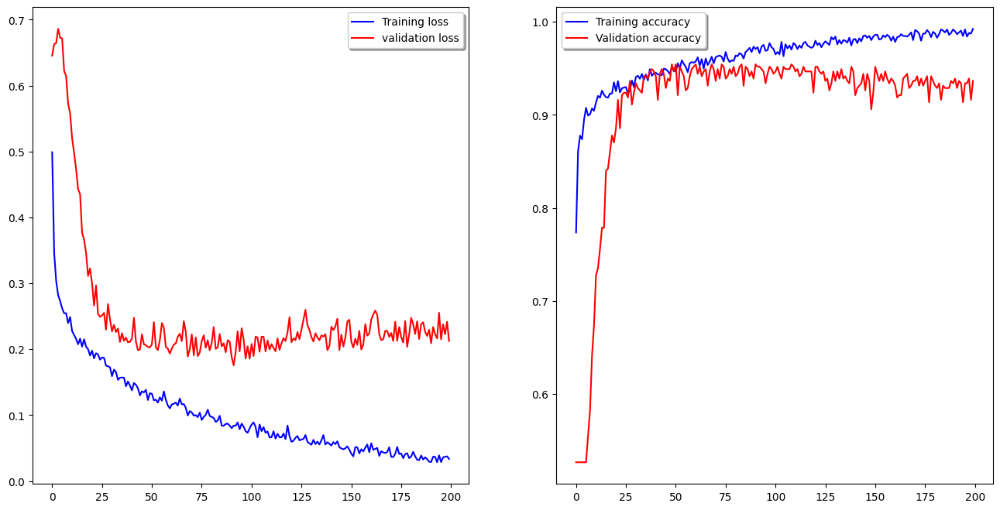

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(16,8))
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

We also apply validation metrics.

In [ ]:
score = Model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.2114628553390503
Test accuracy: 0.9322235584259033


In [ ]:
y_pred = Model.predict(x_test)

27/27 [==============================] - 0s 3ms/step


In [ ]:
y_pred = np.round(y_pred)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.91      0.93       430
           1       0.91      0.95      0.93       411

    accuracy                           0.93       841
   macro avg       0.93      0.93      0.93       841
weighted avg       0.93      0.93      0.93       841



Once the model has been validated, we will apply it to all segments generated by SAMGEO:

In [ ]:
json_to_pred = json.loads(segments.to_json())['features']

In [ ]:
X_pred = []
for i in range(len(json_to_pred)):
  coords = json_to_pred[i]['geometry']
  out_image, out_transform = mask(src, [coords], crop=True, filled=False)
  out_image = out_image.transpose([1,2,0])
  resized_image = cv2.resize(out_image, (80, 80))
  resized_image = resized_image/255
  X_pred.append(resized_image)
X_pred = np.array(X_pred)

In [ ]:
X_pred.shape

(5701, 80, 80, 3)

In [ ]:
Pred = Model.predict(X_pred)

179/179 [==============================] - 1s 3ms/step


In [ ]:
Pred = np.round(Pred)

In [ ]:
segments['Predict'] = Pred

Let's select only those classified as buildings:

In [ ]:
casas = segments[segments['Predict'] == 1]

<Axes: >

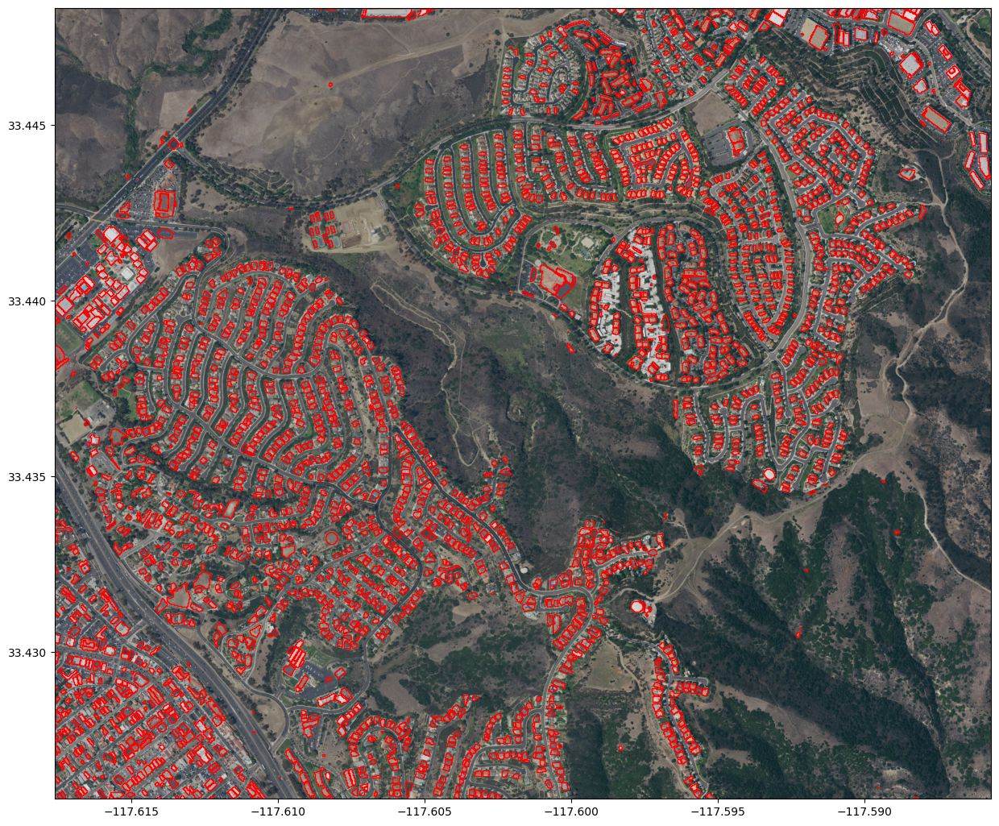

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(src, ax=ax)
casas.plot(ax=ax, facecolor='none', edgecolor='red')

In [ ]:
casas.to_file('casas.shp')

# If you are interested in learning more about Deep learning and computer vision applied to satellite and drone images, my new ebook is available for purchase!!

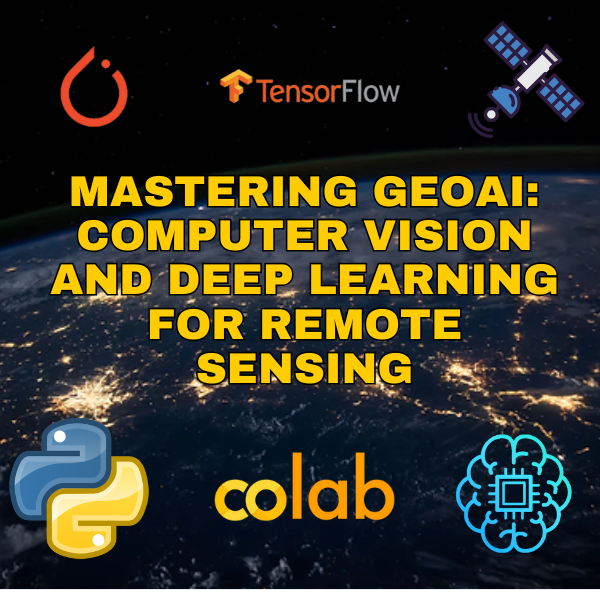

# Link: https://mentoriaai4rs.my.canva.site/mastering-geoai